<a href="https://colab.research.google.com/github/Yan-cabore/Atividades_Visao_Computacional_iRede/blob/main/atividade02.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Atividade 2: Aplicação de filtros**

## Nome: Carlos Yan Matos Ferreira

## Registro das imagens selecionadas:
- **Classe**: ```Cubo```
- **Nome**: cubo1.jpeg
- **Degradação**: desfoque
- **Causa**: ao registrar a imagem, movi a câmera propositalmente para fazer com que a imagem tivesse desfoque
___
- **Classe**: ```Cubo```
- **Nome**: cubo2.jpeg
- **Degradação**: compressão com perda
- **Causa**: apliquei uma compressão com perda para simular a degradação por falta de imagens degradadas o suficiente no presente dataset
___
- **Classe**: ```Carta```
- **Nome**: carta1.jpeg
- **Degradação**: estouro de luz
- **Causa**: quando registrei a imagem ativei o flash propositalmente, forçando um estouro de luz.
- **Extra**: o fundo da imagem apresenta um padrão interessante, como se fosse um sal e pimenta. Fiquei interessado em analisar como a imagem ia se comportar diante disso.
___
- **Classe**: ```Carta```
- **Nome**: carta2.jpeg
- **Degradação**: estouro de luz
- **Causa**: quando bati a foto, ativei o flash para causar um estouro de luz proposital, causando uma alteração na intensidade próxima a parte inferior da carta
- **Extra**: a carta está amassada, além de estar sobre uma mesa de cor similar. Quero ver se os filtros passa alta podem detectar a parte dobrada, além de distinguir bem a carta da mesa

### Carregamento das bibliotecas

In [2]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt
from google.colab import files

### Carregamento das imagens

In [3]:
upload = files.upload()

Saving carta5.jpeg to carta5.jpeg
Saving carta4.jpeg to carta4.jpeg
Saving carta3.jpeg to carta3.jpeg
Saving carta2.jpeg to carta2.jpeg
Saving carta1.jpeg to carta1.jpeg


In [4]:
upload = files.upload()

Saving cubo5.jpeg to cubo5.jpeg
Saving cubo4.jpeg to cubo4.jpeg
Saving cubo3.jpeg to cubo3.jpeg
Saving cubo2.jpeg to cubo2.jpeg
Saving cubo1.jpeg to cubo1.jpeg


## Metodologia utilizada
- Defini uma classe ```utils.py``` para ter uma maior facilidade nessa atividade, assim como nas próximas. A classe ainda é meio básica, mas pretendo deixar ela mais robusta no futuro. Foquei em explicar a lógica da classe dentro da propria, a fim de evitar que fosse necessário explicar durante a chamada de métodos. A classe conta com os seguintes métodos

  1. Leitura das imagens selecionadas
  2. Conversão das imagens de bgr para rgb
  3. Criação de figures
  4. Preenchimento de figures com as imagens lidas
  5. Nomear axes criados dentro das figures
  6. Remoção dos axis presentes dentro das figures (linhas métricas)
  7. Adição de imagens em axes criados anteriormente
  8. Quantizar os níveis de intensidades

- Para deixar o notebook menor, tendo em vista que os filtros devem ser aplicados sobre todas as imagens, decidi criar uma única célula para criar e armazenar as imagens com os filtros já aplicados. Em seguida, criei células feitas especialmente para exibir os resultados. Adotei essa estratégia apenas para os filtros passa baixa

- Os comentários para explicação são fundamentados na documentação oficial do opencv2, além de consultas ao próprio material.

### Definição da classe utils

In [5]:
class Utils():

  def __init__(self):
    return

  def ler_imagens(self, img_list: list): # método para ler as imagens

    for i in range(len(img_list)): # decidi passar as imagens como uma lista de nomes para iterar sobre.
      img_list[i] = cv.imread(img_list[i]) # lendo imagem por imagem

    return img_list

  def converter_bgr(self, img_list: list): # mesmo princípio da leitura, passa a lista de imagens lida e só itero.

    for i in range (len(img_list)):
      img_list[i] = cv.cvtColor(img_list[i], cv.COLOR_BGR2RGB) # convertendo imagem por imagem
    return img_list

  def criar_figure(self, fig_name, axes_x, axes_y, fig_size): # método para criar figure (retorna axes 1D ou 2D dependendo de axes_x, axes_y)
    fig, ax = plt.subplots(axes_x,axes_y, figsize=fig_size)
    fig.suptitle(fig_name)
    fig.tight_layout() # método para deixar a figure criada mais normalizada

    return fig, ax
                                                  # cmap ficou como None porque só preciso dele em gray
  def preencher_figure(self, axe, img_list: list, cmap=None): # método para preencher uma *lista 1D* de axes com as imagens
    # Note: Este método é projetado para axes 1D. Para axes 2D, é necessário iterar com .flatten() ou acessar axe[i, j].
    for i, ax in enumerate(axe): # dessa vez, foi preciso usar o enum, já que é necessário
      ax.imshow(img_list[i], cmap=cmap)     # preencher axes diferentes com imagens diferentes
    return

  def nomear_axes(self, axe, names: list): # método para nomear cada um dos axes
    for i, ax in enumerate(axe):    # o enumerate segue o mesmo princípio de antes
      ax.set_title(names[i])
    return

  def remover_axis(self, axe): # método para remover os axis da figure, seguindo o padrão ensinado pelo professor
    for a in axe:
      a.axis('off')
    return

  def adicionar_imagem(self, axe, img): # método para adicionar imagem a axes vazios
    for ax in axe:
      if not ax.has_data(): # a ideia é percorrer cada um usando o método has_data, que informa se o axe está preenchido ou não
        ax.imshow(img) # preenche o axe quando vazio
        break          # se não houvesse break, o laço preencheria qualquer axe vazio
    return               # no momento em que ele preenche um espaço, o laço quebra
                         # assim, adiciono só uma imagem em um axe por vez


  # método para contar quantidade dos níveis de uma imagem
  def qtd_gray(self, imgs: list):

    # Cria uma cópia da lista de imagens para não modificar a original durante a conversão
    # e garantir que as imagens originais na lista 'imagens_suavizadas' permaneçam coloridas se necessário posteriormente.
    imgs_gray = [cv.cvtColor(img, cv.COLOR_RGB2GRAY) for img in imgs] # Converte todas as imagens para cinza

    qtds = []

    for img_gray in imgs_gray:
      qtds.append(len(np.unique(img_gray)))   # extrai os níveis de tom de cinza

    return qtds # retorna os níveis

## **Aplicando filtros de suavização**

Filtros aplicados:
  - Média
  - Mediana
  - Gaussiano

### **Classe A**

### Imagem 1 - cubo1.jpeg (kernell = 3x3 | sigma = 1)

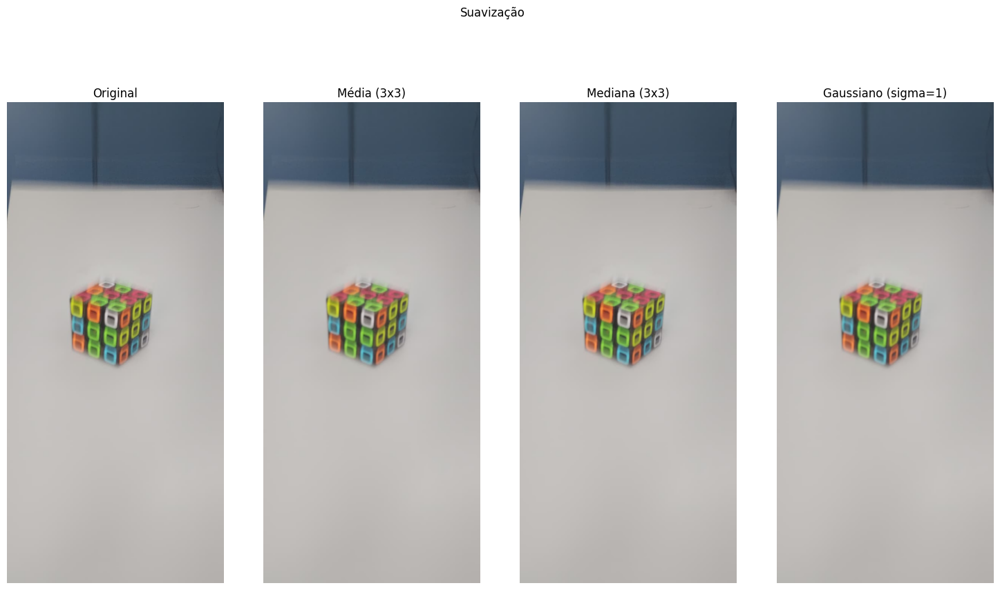

In [6]:
# instanciamento da classe utils
utils = Utils()

# carregamento da imagem única para aplicação de todos os filtros
img_names = ['cubo1.jpeg']
imgs = utils.ler_imagens(img_names)
imgs = utils.converter_bgr(imgs)

# copiando imagem original para servir como base
imagem_original = imgs[0].copy()

# lista para ser utilizada posteriormente
imagens_suavizadas = [imagem_original]
nomes = ['Original']

# --- Filtro da Média ---
# o filtro da média usa um kernel para definir uma janela de operação
# o valor central do kernel é posto sobre o pixel que quer ser alterado
# os outros valores do kernel são multiplicados pelos correspondentes da vizinhança
# os resultados são somados e a média desses valores substitui o valor do pixel alvo

# aplicação do filtro da média
media_3x3 = cv.blur(imagem_original, (3,3)) # Kernel 3x3
media_5x5 = cv.blur(imagem_original, (5,5)) # Kernel 5x5

# adição das imagens novas à lista criada
imagens_suavizadas.append(media_3x3)
imagens_suavizadas.append(media_5x5)

# adição dos nomes para facilitar no método de nomear_axes()
nomes.extend(['Média (3x3)', 'Média (5x5)'])

# --- Filtro da Mediana ---
# o filtro da mediana segue uma ideia próxima ao da média
# é definida uma janela de operação, o pixel central da janela é posto
# sobre o pixel alvo, os valores ao redor são então listados e ordenados crescentemente
# a mediana dos valores ordenados na vizinhaça substitui o pixel alvo

# aplicação filtro da mediana
mediana_3 = cv.medianBlur(imagem_original, 3) # perceba que aqui o kernel é um valor único
mediana_5 = cv.medianBlur(imagem_original, 5) # o método automaticamente faz o quadrado do valor

imagens_suavizadas.append(mediana_3)
imagens_suavizadas.append(mediana_5)
nomes.extend(['Mediana (3x3)', 'Mediana (5x5)'])

# --- Filtro Gaussiano ---
# aqui, a ideia de definir uma janela de ação permanece
# a ideia do cálculo da média da vizinhança também
# a diferença é a influência de sigma, que determina o peso
# dos que os pixels possuem na operação
# quanto maior sigma, maior peso nos pixels próximos do centro, maior suavização

# aplicação do filtro gaussiano
gaussiano_sigma1 = cv.GaussianBlur(imagem_original, (5,5), 1) # Kernel 5x5, sigma = 1
gaussiano_sigma3 = cv.GaussianBlur(imagem_original, (5,5), 3) # Kernel 5x5, sigma = 3

imagens_suavizadas.append(gaussiano_sigma1)
imagens_suavizadas.append(gaussiano_sigma3)
nomes.extend(['Gaussiano (sigma=1)', 'Gaussiano (sigma=3)'])

# extração de todos os níveis na imagem
qtd_cubo1 = utils.qtd_gray(imagens_suavizadas)

# criando lista
local_imagens = [
    imagens_suavizadas[0],   # Original
    imagens_suavizadas[1],   # Média (3x3)
    imagens_suavizadas[3],   # Mediana (3x3)
    imagens_suavizadas[5]    # Gaussiano (sigma=1)
]
nomes_axes = [
    'Original',
    'Média (3x3)',
    'Mediana (3x3)',
    'Gaussiano (sigma=1)'
]

# utilização dos métodos de criar e nomear figure,
# em conjunto com a lista local_imagens
fig, ax = utils.criar_figure('Suavização', 1, 4, (15,10))
utils.preencher_figure(ax, local_imagens)
utils.nomear_axes(ax, nomes_axes)
utils.remover_axis(ax)

### Imagem 1 - cubo1.jpeg (kernell = 5x5 | sigma = 3)

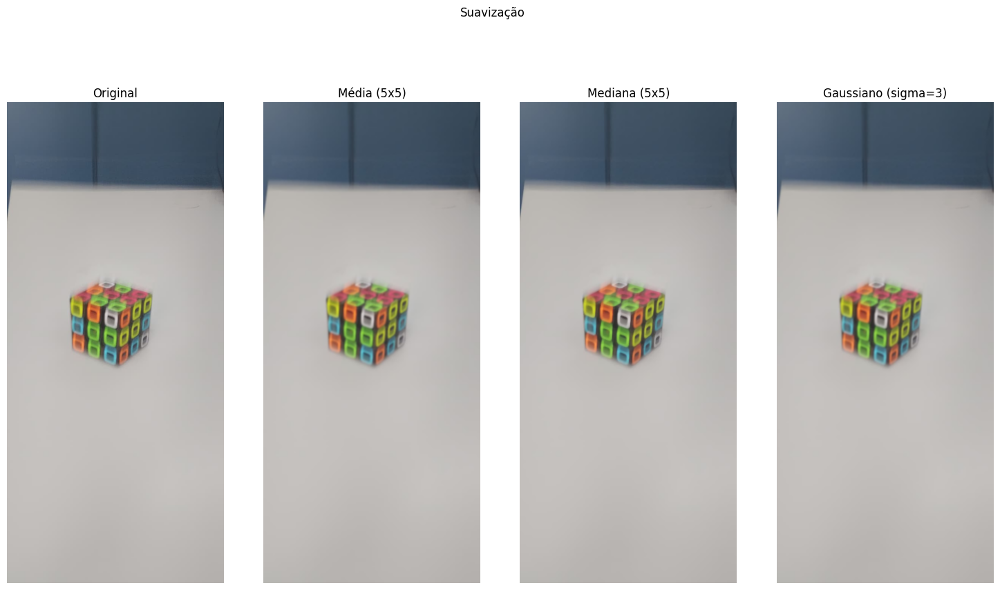

In [7]:
# como as operações foram salvas sequencialmente, basta mover cada índice uma
# posição, com excessão da imagem original, que foi passada como cópia para
# ser o primeiro elemento da lista

local_imagens = [
    imagens_suavizadas[0],
    imagens_suavizadas[2],
    imagens_suavizadas[4],
    imagens_suavizadas[6]
]

nomes_axes = [
    'Original',
    'Média (5x5)',
    'Mediana (5x5)',
    'Gaussiano (sigma=3)'
]

fig, ax = utils.criar_figure('Suavização', 1, 4, (15,10))
utils.preencher_figure(ax, local_imagens)
utils.nomear_axes(ax, nomes_axes)
utils.remover_axis(ax)

### Imagem 2 - cubo2.jpeg (kernell = 3x3 | sigma = 1)

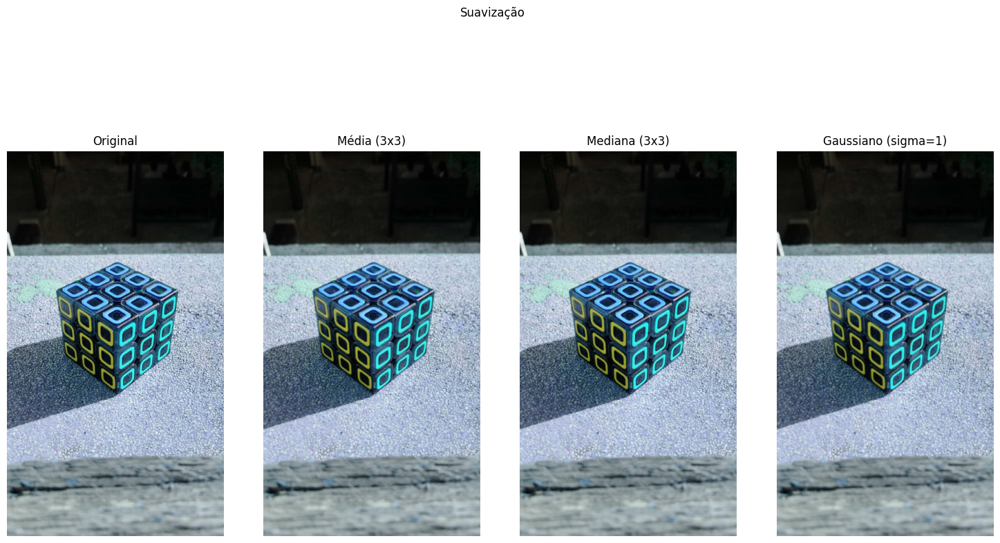

In [8]:
utils = Utils()

# introdução da compreção
img = 'cubo2.jpeg'
img = cv.imread(img)
cv.cvtColor(img, cv.COLOR_BGR2RGB)
cv.imwrite('cubo2comp.jpeg', img, [cv.IMWRITE_JPEG_QUALITY, 50])

img_names = ['cubo2comp.jpeg']
imgs = utils.ler_imagens(img_names)


imagem_original = imgs[0]

imagens_suavizadas = [imagem_original]
nomes = ['Original']

media_3x3 = cv.blur(imagem_original, (3,3))
media_5x5 = cv.blur(imagem_original, (5,5))

imagens_suavizadas.append(media_3x3)
imagens_suavizadas.append(media_5x5)

nomes.extend(['Média (3x3)', 'Média (5x5)'])

mediana_3 = cv.medianBlur(imagem_original, 3)
mediana_5 = cv.medianBlur(imagem_original, 5)

imagens_suavizadas.append(mediana_3)
imagens_suavizadas.append(mediana_5)
nomes.extend(['Mediana (3x3)', 'Mediana (5x5)'])

gaussiano_sigma1 = cv.GaussianBlur(imagem_original, (5,5), 1)
gaussiano_sigma3 = cv.GaussianBlur(imagem_original, (5,5), 3)

imagens_suavizadas.append(gaussiano_sigma1)
imagens_suavizadas.append(gaussiano_sigma3)
nomes.extend(['Gaussiano (sigma=1)', 'Gaussiano (sigma=3)'])

# extração de todos os níveis na imagem
qtd_cubo2 = utils.qtd_gray(imagens_suavizadas)

local_imagens = [
    imagens_suavizadas[0],
    imagens_suavizadas[1],
    imagens_suavizadas[3],
    imagens_suavizadas[5]
]
nomes_axes = [
    'Original',
    'Média (3x3)',
    'Mediana (3x3)',
    'Gaussiano (sigma=1)'
]

fig, ax = utils.criar_figure('Suavização', 1, 4, (15,10))
utils.preencher_figure(ax, local_imagens)
utils.nomear_axes(ax, nomes_axes)
utils.remover_axis(ax)

### Imagem 2 - cubo2.jpeg (kernell = 5x5 | sigma = 3)

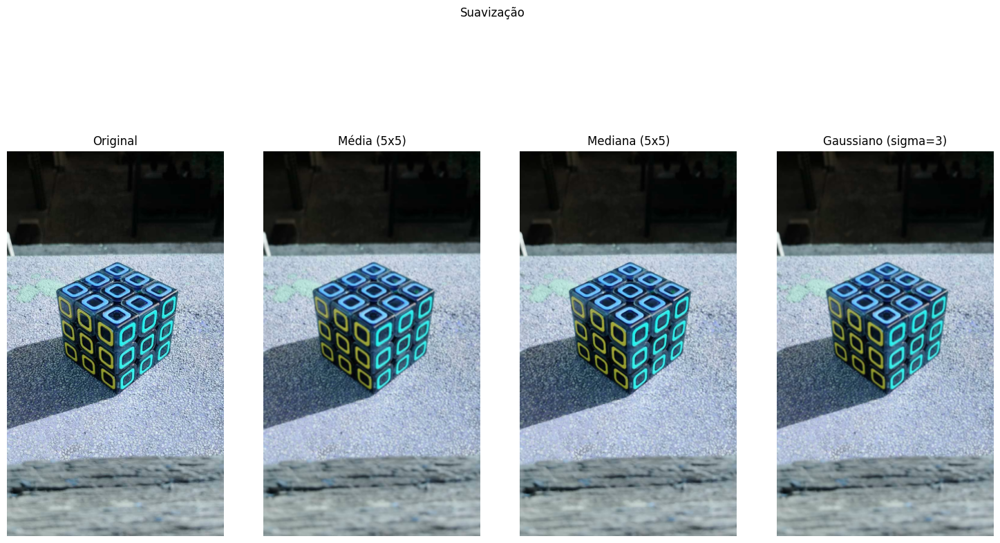

In [9]:
local_imagens = [
    imagens_suavizadas[0],
    imagens_suavizadas[2],
    imagens_suavizadas[4],
    imagens_suavizadas[6]
]

nomes_axes = [
    'Original',
    'Média (5x5)',
    'Mediana (5x5)',
    'Gaussiano (sigma=3)'
]

fig, ax = utils.criar_figure('Suavização', 1, 4, (15,10))
utils.preencher_figure(ax, local_imagens)
utils.nomear_axes(ax, nomes_axes)
utils.remover_axis(ax)

### **Classe B**

### Imagem 1 - carta1.jpeg (kernell: = 3x3 | sigma = 1)

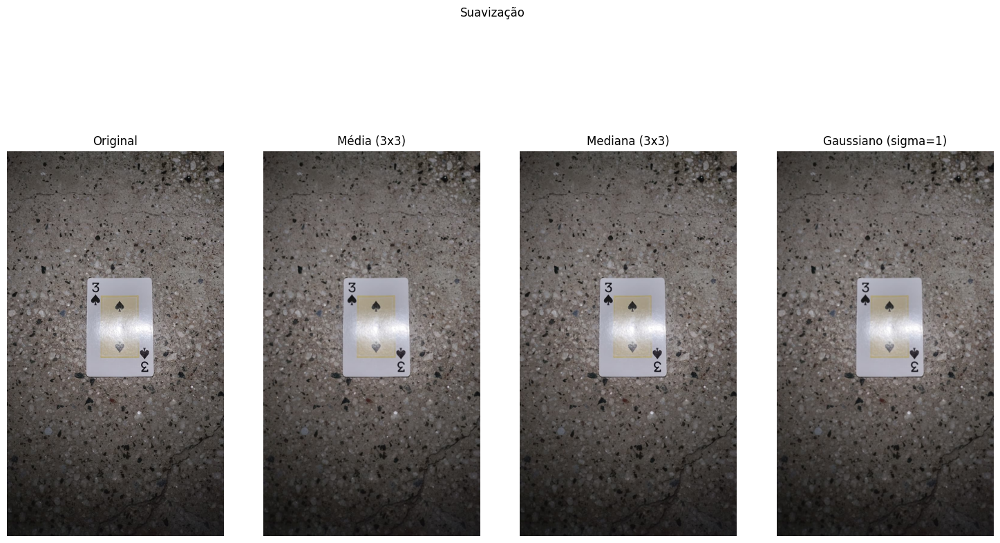

In [10]:
utils = Utils()

img_names = ['carta1.jpeg'] # basta alterar o nome da imagem
imgs = utils.ler_imagens(img_names)
imgs = utils.converter_bgr(imgs)

imagem_original = imgs[0].copy()

imagens_suavizadas = [imagem_original]
nomes = ['Original']

media_3x3 = cv.blur(imagem_original, (3,3))
media_5x5 = cv.blur(imagem_original, (5,5))

imagens_suavizadas.append(media_3x3)
imagens_suavizadas.append(media_5x5)

nomes.extend(['Média (3x3)', 'Média (5x5)'])

mediana_3 = cv.medianBlur(imagem_original, 3)
mediana_5 = cv.medianBlur(imagem_original, 5)

imagens_suavizadas.append(mediana_3)
imagens_suavizadas.append(mediana_5)
nomes.extend(['Mediana (3x3)', 'Mediana (5x5)'])

gaussiano_sigma1 = cv.GaussianBlur(imagem_original, (5,5), 1)
gaussiano_sigma3 = cv.GaussianBlur(imagem_original, (5,5), 3)

imagens_suavizadas.append(gaussiano_sigma1)
imagens_suavizadas.append(gaussiano_sigma3)
nomes.extend(['Gaussiano (sigma=1)', 'Gaussiano (sigma=3)'])

# extração de todos os níveis na imagem
qtd_carta1 = utils.qtd_gray(imagens_suavizadas)

local_imagens = [
    imagens_suavizadas[0],
    imagens_suavizadas[1],
    imagens_suavizadas[3],
    imagens_suavizadas[5]
]
nomes_axes = [
    'Original',
    'Média (3x3)',
    'Mediana (3x3)',
    'Gaussiano (sigma=1)'
]

fig, ax = utils.criar_figure('Suavização', 1, 4, (15,10))
utils.preencher_figure(ax, local_imagens)
utils.nomear_axes(ax, nomes_axes)
utils.remover_axis(ax)

### Imagem 1 - carta1.jpeg (kernell: = 5x5 | sigma = 3)

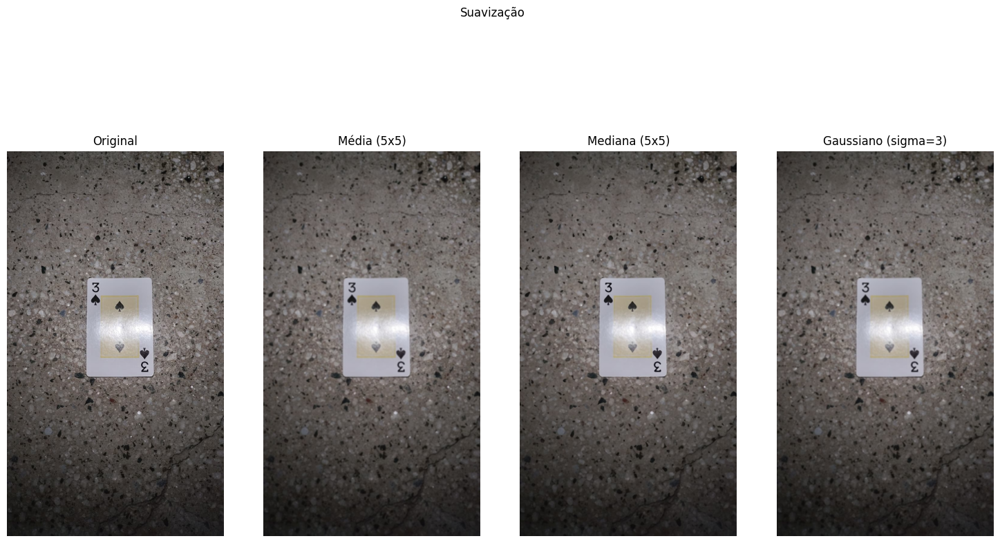

In [11]:
local_imagens = [
    imagens_suavizadas[0],
    imagens_suavizadas[2],
    imagens_suavizadas[4],
    imagens_suavizadas[6]
]

nomes_axes = [
    'Original',
    'Média (5x5)',
    'Mediana (5x5)',
    'Gaussiano (sigma=3)'
]

fig, ax = utils.criar_figure('Suavização', 1, 4, (15,10))
utils.preencher_figure(ax, local_imagens)
utils.nomear_axes(ax, nomes_axes)
utils.remover_axis(ax)

### Imagem 2 - carta2.jpeg (kernell: = 3x3 | sigma = 1)

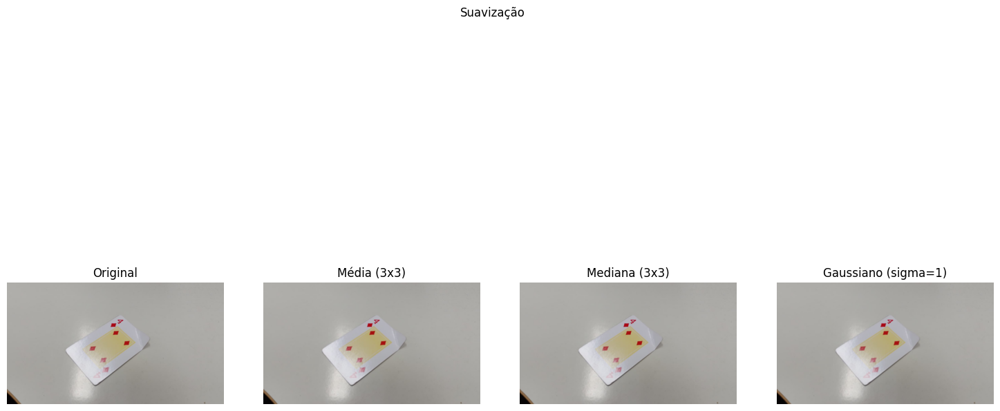

In [12]:
utils = Utils()

img_names = ['carta2.jpeg'] # basta alterar o nome da imagem
imgs = utils.ler_imagens(img_names)
imgs = utils.converter_bgr(imgs)

imagem_original = imgs[0].copy()

imagens_suavizadas = [imagem_original]
nomes = ['Original']

media_3x3 = cv.blur(imagem_original, (3,3))
media_5x5 = cv.blur(imagem_original, (5,5))

imagens_suavizadas.append(media_3x3)
imagens_suavizadas.append(media_5x5)

nomes.extend(['Média (3x3)', 'Média (5x5)'])

mediana_3 = cv.medianBlur(imagem_original, 3)
mediana_5 = cv.medianBlur(imagem_original, 5)

imagens_suavizadas.append(mediana_3)
imagens_suavizadas.append(mediana_5)
nomes.extend(['Mediana (3x3)', 'Mediana (5x5)'])

gaussiano_sigma1 = cv.GaussianBlur(imagem_original, (5,5), 1)
gaussiano_sigma3 = cv.GaussianBlur(imagem_original, (5,5), 3)

imagens_suavizadas.append(gaussiano_sigma1)
imagens_suavizadas.append(gaussiano_sigma3)
nomes.extend(['Gaussiano (sigma=1)', 'Gaussiano (sigma=3)'])

# extração de todos os níveis na imagem
qtd_carta2 = utils.qtd_gray(imagens_suavizadas)

local_imagens = [
    imagens_suavizadas[0],
    imagens_suavizadas[1],
    imagens_suavizadas[3],
    imagens_suavizadas[5]
]
nomes_axes = [
    'Original',
    'Média (3x3)',
    'Mediana (3x3)',
    'Gaussiano (sigma=1)'
]

fig, ax = utils.criar_figure('Suavização', 1, 4, (15,10))
utils.preencher_figure(ax, local_imagens)
utils.nomear_axes(ax, nomes_axes)
utils.remover_axis(ax)

### Imagem 2 - carta2.jpeg (kernell = 5x5 | sigma = 3)

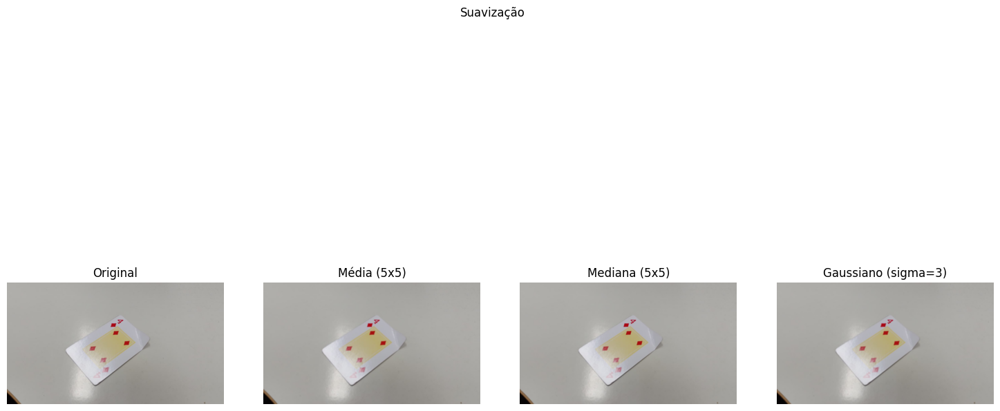

In [13]:
local_imagens = [
    imagens_suavizadas[0],
    imagens_suavizadas[2],
    imagens_suavizadas[4],
    imagens_suavizadas[6]
]

nomes_axes = [
    'Original',
    'Média (5x5)',
    'Mediana (5x5)',
    'Gaussiano (sigma=3)'
]

fig, ax = utils.criar_figure('Suavização', 1, 4, (15,10))
utils.preencher_figure(ax, local_imagens)
utils.nomear_axes(ax, nomes_axes)
utils.remover_axis(ax)

## **Conclusões**:

## Qual filtro reduziu mais o ruído:
### Vou abordar analisando os rúidos de cada classe de maneira individual
- Classe A - Desfoque
  - Filtro Gaussiano | σ = 3: o desfoque é caracterizado pela falta de transições abruptas entre as intensidades dos pixels. Diante disso, foi difícil discernir entre os filtros qual atenuou melhor o ruído, já que filtros passa baixa não são ideais para lidar com desfoque. A vizinhaça é composta de pixels de intensidade próxima, o que faria com que a convolução devolvesse valores cada vez mais baixos. Dito isso, o ideal foi escolher o filtro que menos "borrase" o cubo quando aplicado, o que me levou a escolher o filtro gaussiano. Analisando a imagem ```cubo1.jpeg```, percebe-se que o filtro gaussiano foi o que mais se aproximou do original, enquanto a média e a mediana ficaram levemente mais borradas. Não vi muita diferença entre o gaussiano com sigma = 1 e sigma = 3, então selecionei o que melhor reduziu os artefatos.

- Classe A - Compressão
  - Filtro da Gaussiano | σ = 5: analisando a imagem ```cubo2.jpeg```,percebi que, apesar do filtro da média presente na imagem ter mantido mais a itensidade da cor de cada quadrado colorido do cubo, ele não reduziu tão bem a quantidade de artefatos como o filtro gaussiano. Não considerei o filtro da média durante o processo por ele ter deixado as bordas menos preservada em relação aos outros dois. Assim como no desfoque, o fato desse filtro ser capaz de fazer transições mais suaves no processo convolucional fez ele se sobressair.

- Classe B - Estouro de luz
  - Filtro da Mediana: apesar do filtro gaussiano ter preservado melhor as bordas na imagem 1 e 2, percebi que o filtro da mediana teve uma maior capacidade de reduzir os pequenos pontos aleatórios presentes na imagem 2, além de ter demonstrado diminuir mais a intensidade da luz na imagem 1. Como a mediana ordena os valores, pixels de alta intensidade ficam sempre localizados nos extremos, o que gera um descarte após a mediana ser encontrada. Como prova, basta observar a pequena dobra na imagem ```carta2.jpeg```. Perceba que, na original, há um reflexo da luz exatamente onde ocorre a dobra. Olhando as imagens com os filtros aplicados, a mediana parece ser a que mais atenuou esse detalhe.


## Qual preservou melhor as bordas:

### **Classe A & B**
- Para ambas as classes, o filtro que melhor preservou as bordas foi o gaussiano, com sigma = 1, garantindo menor interferência nas bordas. A imagem que melhor demonstra essa ocorrência é a imagem ```cubo2.jpeg```. Como dito anteriormente, o filtro gaussiano tem a capacidade de utilizar um peso durantes as operações convolucionais. É realizada uma média ponderada que atribui aos pixels mais próximos do centro um peso maior, enquanto os mais distantes recebem um peso menor. Isso atenua ruídos, mas não interfere tanto na intensidade de regiões mais distantes.

## Tabela de variância dos níveis de cinza:


In [14]:
quantidades = [qtd_cubo1, qtd_cubo2, qtd_carta1, qtd_carta2]

# Nomes das imagens correspondentes, assumindo a mesma ordem em 'quantidades'
nomes_imagens = ['cubo1.jpeg', 'cubo2.jpeg', 'carta1.jpeg', 'carta2.jpeg']

# lógica usando enum para printar as qtds rapidamente
for i, qtd_list in enumerate(quantidades):
    print(f"Níveis de cinza para {nomes_imagens[i]}:")
    for valor in qtd_list:
        print(f"  - {valor}")
    print("\n") # facilita leitura dos nomes das imagens

Níveis de cinza para cubo1.jpeg:
  - 172
  - 165
  - 162
  - 166
  - 162
  - 165
  - 163


Níveis de cinza para cubo2.jpeg:
  - 254
  - 248
  - 243
  - 249
  - 245
  - 247
  - 243


Níveis de cinza para carta1.jpeg:
  - 256
  - 247
  - 245
  - 253
  - 246
  - 245
  - 245


Níveis de cinza para carta2.jpeg:
  - 227
  - 224
  - 224
  - 224
  - 224
  - 224
  - 224




| Filtro       | Kernel | Sigma | cubo1.jpeg | cubo2.jpeg | carta1.jpeg | carta2.jpeg |
|--------------|:------:|:-----:|:----------:|:----------:|:-----------:|:-----------:|
| Original     |   -    |   -   |    172     |    256     |     256     |     227     |
| Média        |  3x3   |   -   |    165     |    254     |     247     |     224     |
| Média        |  5x5   |   -   |    162     |    248     |     245     |     224     |
| Mediana      |  3x3   |   -   |    166     |    256     |     253     |     224     |
| Mediana      |  5x5   |   -   |    162     |    250     |     246     |     224     |
| Gaussiano    |  5x5   |   1   |    165     |    252     |     245     |     224     |
| Gaussiano    |  5x5   |   3   |    163     |    248     |     245     |     224     |

- Os níveis originais de cada imagem se reduziram. Isso se deve ao fato dos filtros de suavização fazer com que os pixels vizinhos fiquem parecidos entre si, ocasionando uma redução dos níveis de representação.

## **Aplicando filtros de detecção de bordas**

### Filtros aplicados:
  - Sobel
  - Prewitt
  - Canny
### Imagens selecionadas:
  - Classe A:
    - cubo1.jpeg
    - Motivo: a imagem apresenta desfoque, o que é ideal para testar se é possível detectar as bordas de um objeto que está borrado. Além disso, vai ser possível analisar o quanto o processo de suavização pode influenciar quando uma imagem original apresenta desfoque
  - Classe B:
    - carta2.jpeg
    - Motivo: a carta na imagem está bem enquadrada, mas há um flash na carta, além da mesma estar com uma leve dobra. Isso é perfeito para testar se os filtros podem detectar a dobra, além de analisar como o número que foi parcialmente ofuscado pelo reflexo vai ficar após aplicar os filtros  

## ***Classe A***

## Sobel

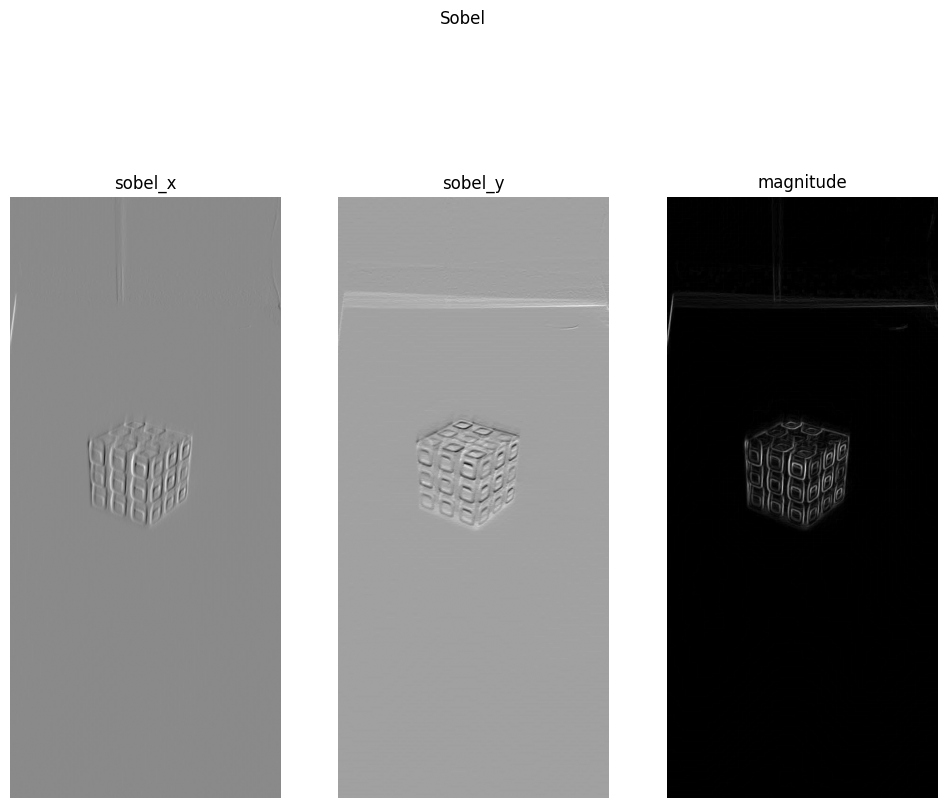

In [15]:
utils = Utils()
imgs = ['cubo1.jpeg']
utils.ler_imagens(imgs)
imgs = utils.converter_bgr(imgs)

# criando uma cópia na escala de cinza
# o filtro de sobel calcula a taxa de variação de intensidades
# diante disso, calcular a variação em 3 canais diferentes seria muito complexo
# e resultaria em erros (o que eu aprendi na prática)
escala_cinza = cv.cvtColor(imgs[0], cv.COLOR_RGB2GRAY)

# aplicação do filtro de sobel
# o método cv.CV_64F define a profundidade do resultado, sendo o padrão um float64
# os valores numéricos (0,1) representam em qual eixo será realizado o cálculo para detecção
# o kernel define o "escopo" da operação
sobel_x = cv.Sobel(escala_cinza, cv.CV_64F, 1, 0, ksize=3)
sobel_y = cv.Sobel(escala_cinza, cv.CV_64F, 0, 1, ksize=3)

# representa a intensidade total na borda, juntando as variações calculadas nos eixos
sobel_xy_cubo= cv.magnitude(sobel_x, sobel_y)

imgs.append(sobel_x)
imgs.append(sobel_y)
imgs.pop(0) # remoção da imagem original, sobrando apenas as imagens requisitadas na atividade
imgs.append(sobel_xy_cubo)

fig, ax = utils.criar_figure('Sobel', 1,3, (10,10))
nomes = ['sobel_x', 'sobel_y', 'magnitude']
utils.nomear_axes(ax, nomes)
utils.preencher_figure(ax, imgs, cmap='gray')

utils.remover_axis(ax)


## Prewitt

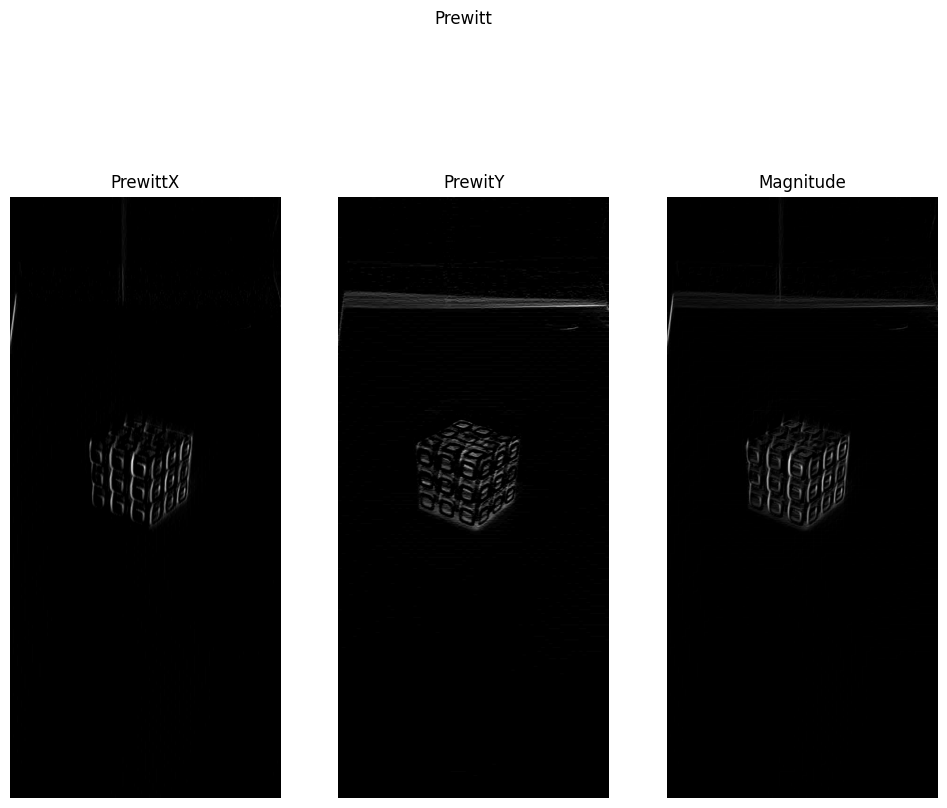

In [16]:
utils = Utils()

imgs = ['cubo1.jpeg']
utils.ler_imagens(imgs)
imgs = utils.converter_bgr(imgs)

escala_cinza = cv.cvtColor(imgs[0], cv.COLOR_RGB2GRAY)

# O filtro de prewitt não é nativo do opencv, então é necessário
# fazer uma aplicação de uma forma manual usando o método cv.filter2D
# esse método permite a aplicação de um kernel personalizado sobre imagens

# criação das matrizes dos kernels para serem usados como parâmetro
kernel_x = np.array([[-1,0,1],[-1,0,1],[-1,0,1]])
kernel_y = np.array([[-1,-1,-1],[0,0,0],[1,1,1]])

# aplicação manual do filtro
prewitt_x = cv.filter2D(escala_cinza, -1, kernel_x) # o -1 define a profundidade da imagem resultante
prewitt_y = cv.filter2D(escala_cinza, -1, kernel_y)

# a ideia é a mesma de antes, mas como a profundidade do resultado não foi definida
# anteriormente, é preciso usar o método np.float32 para definir a profundidade da saída
prewitt_xy_cubo = cv.magnitude(np.float32(prewitt_x), np.float32(prewitt_y))

imgs.append(prewitt_x)
imgs.append(prewitt_y)
imgs.append(prewitt_xy_cubo)
imgs.pop(0)

fig, ax = utils.criar_figure('Prewitt', 1,3, (10,10))
nomes = ['PrewittX', 'PrewitY', 'Magnitude']
utils.nomear_axes(ax, nomes)
utils.preencher_figure(ax, imgs, cmap='gray')
utils.remover_axis(ax)

## Canny

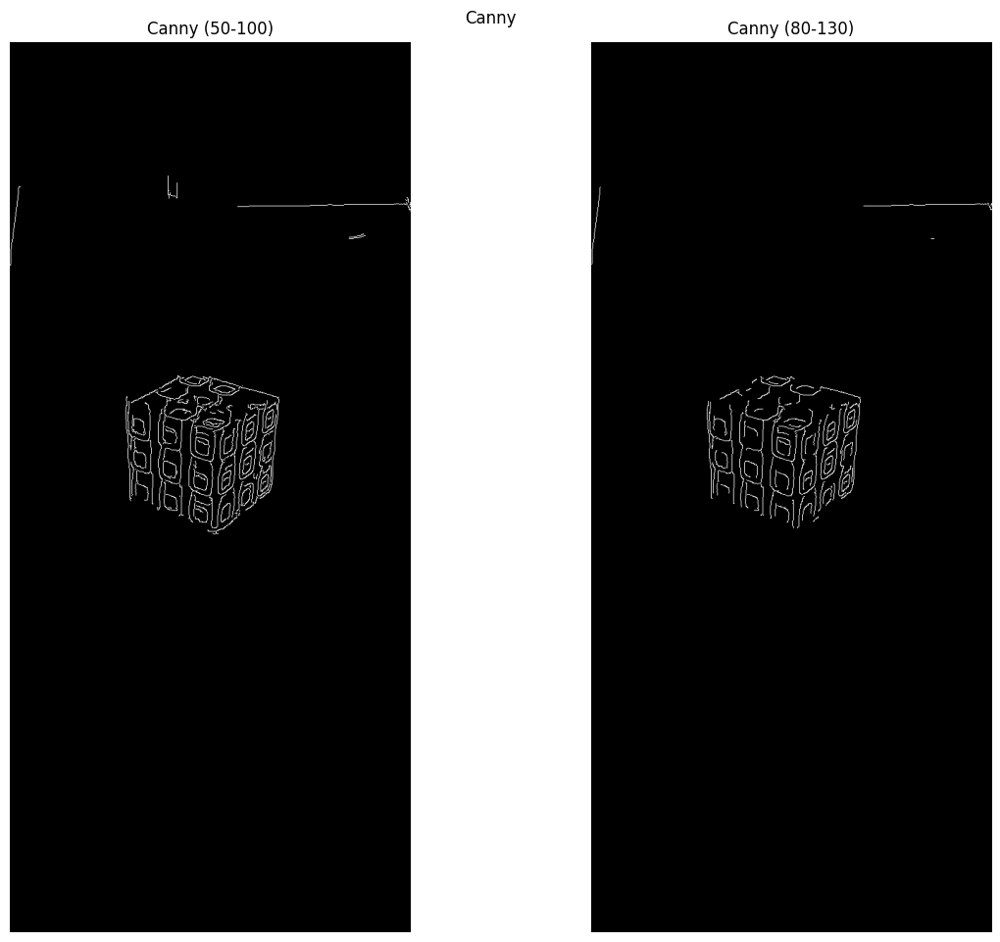

In [17]:
utils = Utils()

imgs = ['cubo1.jpeg']
utils.ler_imagens(imgs)
imgs = utils.converter_bgr(imgs)

escala_cinza = cv.cvtColor(imgs[0], cv.COLOR_RGB2GRAY)

# o filtro canny detecta mudanças dos valores de intensidade
# dentro de um limiar inferior e superior definido na chamada da função
canny1_cubo = cv.Canny(escala_cinza, 50, 100) # limiar inferior = 50 | superior = 100
canny2_cubo = cv.Canny(escala_cinza, 80, 130) # limiar inferior = 80 | superior = 130
# esses limiares foram selecionados por terem sido apresentados na mentoria

imgs.append(canny1_cubo)
imgs.append(canny2_cubo)
imgs.pop(0)

fig, ax = utils.criar_figure('Canny', 1, 2, (12, 10))
nomes = ['Canny (50-100)', 'Canny (80-130)']
utils.nomear_axes(ax, nomes)
utils.preencher_figure(ax, imgs, cmap='gray')
utils.remover_axis(ax)

## ***Classe B***

## Sobel

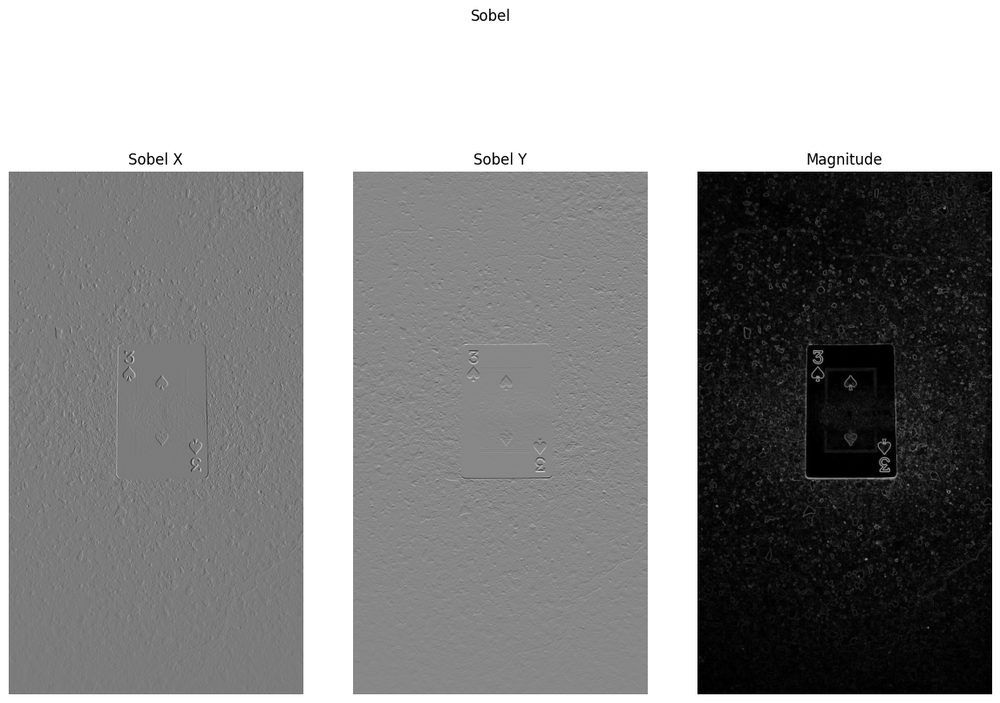

In [18]:
utils = Utils()
img_names = ['carta1.jpeg']
imgs = utils.ler_imagens(img_names)
imgs = utils.converter_bgr(imgs)
escala_cinza = cv.cvtColor(imgs[0], cv.COLOR_RGB2GRAY)

sobel_x = cv.Sobel(escala_cinza, cv.CV_64F, 1, 0, ksize=3)
sobel_y = cv.Sobel(escala_cinza, cv.CV_64F, 0, 1, ksize=3)
sobel_xy_carta = cv.magnitude(sobel_x, sobel_y)

imgs.pop(0)
imgs.append(sobel_x)
imgs.append(sobel_y)
imgs.append(sobel_xy_carta)

fig, ax = utils.criar_figure('Sobel', 1,3, (12,10))
nomes = ['Sobel X', 'Sobel Y', 'Magnitude']
utils.nomear_axes(ax, nomes)
utils.preencher_figure(ax, imgs, cmap='gray')
utils.remover_axis(ax)

## Prewitt

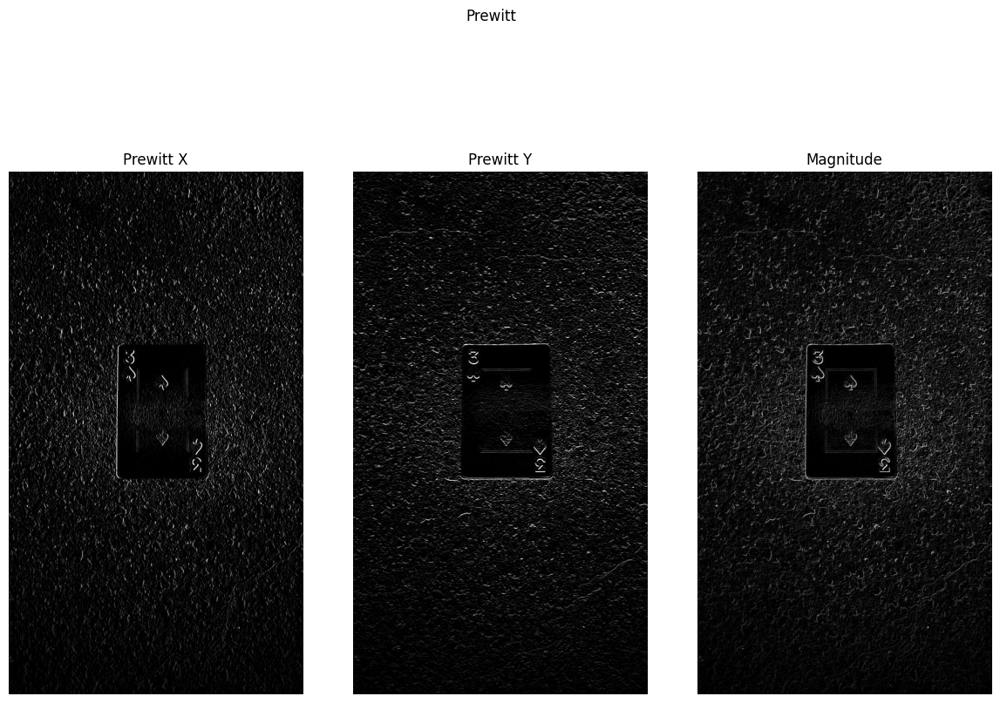

In [19]:
utils = Utils()
img_names = ['carta1.jpeg']
imgs = utils.ler_imagens(img_names)
imgs = utils.converter_bgr(imgs)
escala_cinza = cv.cvtColor(imgs[0], cv.COLOR_RGB2GRAY)

kernel_x = np.array([[-1,0,1],[-1,0,1],[-1,0,1]])
kernel_y = np.array([[-1,-1,-1],[0,0,0],[1,1,1]])

prewitt_x = cv.filter2D(escala_cinza, -1, kernel_x)
prewitt_y = cv.filter2D(escala_cinza, -1, kernel_y)
prewitt_xy_carta = cv.magnitude(np.float32(prewitt_x), np.float32(prewitt_y))

imgs.pop(0)
imgs.append(prewitt_x)
imgs.append(prewitt_y)
imgs.append(prewitt_xy_carta)

fig, ax = utils.criar_figure('Prewitt', 1,3, (12,10))
nomes = ['Prewitt X', 'Prewitt Y', 'Magnitude']
utils.nomear_axes(ax, nomes)
utils.preencher_figure(ax, imgs, cmap='gray')
utils.remover_axis(ax)

## Canny

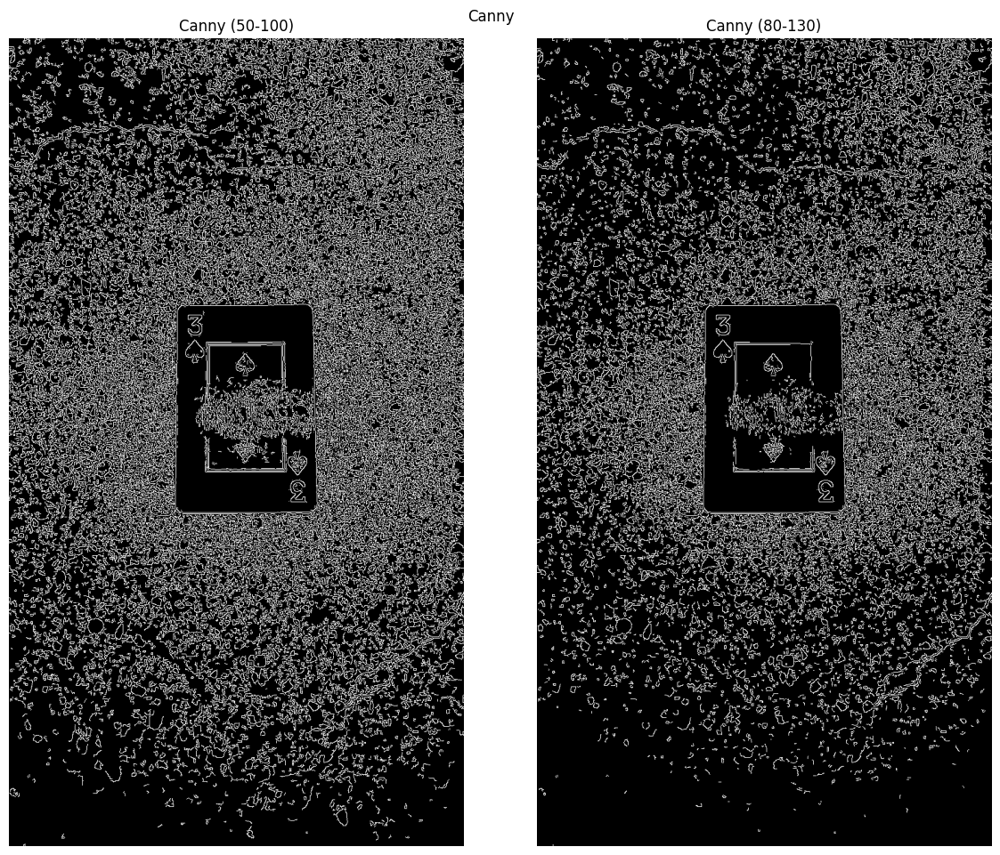

In [20]:
utils = Utils()
img_names = ['carta1.jpeg']
imgs = utils.ler_imagens(img_names)
imgs = utils.converter_bgr(imgs)
escala_cinza = cv.cvtColor(imgs[0], cv.COLOR_RGB2GRAY)

canny1_carta = cv.Canny(escala_cinza, 50, 100)
canny2_carta = cv.Canny(escala_cinza, 80, 130)

imgs.pop(0)
imgs.append(canny1_carta)
imgs.append(canny2_carta)

fig, ax = utils.criar_figure('Canny', 1,2, (12,10))
nomes = ['Canny (50-100)', 'Canny (80-130)']
utils.nomear_axes(ax, nomes)
utils.preencher_figure(ax, imgs, cmap='gray')
utils.remover_axis(ax)

# **Registro**:

## Presença de bordas falsas:





In [21]:
imagens_filtradas = [
    ("Sobel - cubo",    sobel_xy_cubo),
    ("Sobel - carta",   sobel_xy_carta),
    ("Prewitt - cubo",  prewitt_xy_cubo),
    ("Prewitt - carta", prewitt_xy_carta),
    ("Canny - cubo", canny2_cubo),
    ("Canny - carta", canny2_carta)
]


def calcular_metricas_borda(imagem_filtrada, tamanho_borda=5):
    altura, largura = imagem_filtrada.shape

    # criar a máscara booleana isolando apenas a moldura
    mascara_moldura = np.ones((altura, largura), dtype=bool)
    mascara_moldura[tamanho_borda:-tamanho_borda, tamanho_borda:-tamanho_borda] = False

    # isolar os pixels da borda artificial e do miolo da imagem
    pixels_borda = imagem_filtrada[mascara_moldura]
    pixels_centro = imagem_filtrada[~mascara_moldura]

    # calcular a média absoluta da intensidade
    energia_borda = np.mean(np.abs(pixels_borda))
    media_centro = np.mean(np.abs(pixels_centro))

    # calcular a razão matemática para provar a anomalia
    razao = energia_borda / media_centro if media_centro > 0 else energia_borda

    return energia_borda, razao

print(f"{'Filtro Aplicado':<18} | {'Energia da Borda (Brilho)':<26} | {'Razão Borda/Centro':<20}")
print("-" * 72)

for nome_filtro, img_filtrada in imagens_filtradas:
    energia, razao = calcular_metricas_borda(img_filtrada, tamanho_borda=5)
    print(f"{nome_filtro:<18} | {energia:<26.2f} | {razao:<20.2f}")

Filtro Aplicado    | Energia da Borda (Brilho)  | Razão Borda/Centro  
------------------------------------------------------------------------
Sobel - cubo       | 2.76                       | 0.52                
Sobel - carta      | 41.36                      | 0.67                
Prewitt - cubo     | 1.60                       | 0.69                
Prewitt - carta    | 17.43                      | 0.69                
Canny - cubo       | 0.87                       | 0.54                
Canny - carta      | 24.73                      | 0.62                


Conclusão:
- A análise quantitativa revelou uma Razão Borda/Centro consistentemente abaixo de 1.0 em todas as imagens testadas com os operadores Sobel, Prewitt e Canny. Estatisticamente, esse comportamento comprova a ausência de bordas falsas. Essa afirmação é justificada pelo fato dos métodos do opencv2 utilizados já garantirem uma proteção contra esses tipos de artefatos.

## Sensibilidade a ruído:

- Sobel:
  
  - Desfoque: o filtro não parece ter sido muito afetado com a presença de desfoque. Curiosamente, o resultado do cálculo do eixo y foi mais satisfatório do que o resultado do cálculo da magnitude. O filtro é levemente sensível
  
  - Estouro de luz: o filtro foi capaz de segmentar toda a borda da carta, mas foi incapaz de segmentar perfeitamente o molde do centro da carta. Diante disso, pode-se afirmar que, caso o estouro de luz fosse maior, o filtro seria prejudicado devida à grande área de alta intensidade, que causaria uma homogeniedade da intensidade no local onde estivesse. Ainda, o filtro foi bastante afetado pelo fundo da imagem, o que sugere que ele tenha uma sensibilidade alta a ruídos parecidos com os do tipo sal e pimenta. O filtro é bastante sensível a estouros de luz.

- Prewitt:

  - Desfoque: assim como sobel, o filtro foi levemente afetado, não gerando bordas tão precisas. Ainda assim, o filtro obteve um resultado mais satisfatório comparado a sobel, tendo os pequenos quadrados do cubo levemente mais nítidos. O filtro não é muito sensível a desfoques.

  - Estouro de luz: não foi tão afetado quanto sobel, mas ainda assim foi incapaz de detectar as bordas da área central da carta. Ainda, percebe-se que o fundo da imagem ficou ainda mais destacado, o que sugere que o filtro de prewitt tenha uma sensibilidade muito maior a ruídos do tipo sal e pimenta quando comparado a sobel. O filtro fortemente sensível ao estouro de luz.

- Canny:
  
  - Desfoque: as linhas das bordas ficaram tortas, o que sugere que o desfoque tenha contribuído para a distorção das mesmas. Ainda, houveram bordas presentes no cubo que não foram detectadas. Sabendo que as bordas foram detectadas, só não de maneira simétrica, eu diria que o filtro é sensível a esse tipo de ruído.

  - Estouro de luz: o filtro de canny se mostrou altamente sensível à presença de uma forte alteração da intensidade presente na carta. Ainda, percebe-se que o fundo na imagem impactou fortemente a aplicação do filtro, causando diversas bordas indesejadas, levando em consideração que o foco era a carta. Diante disso, conclui-se que o filtro é altamente sensível a variações na intensidade, assim como a presença de ruídos como sal e pimenta;

## Comparação visual entre cada método:


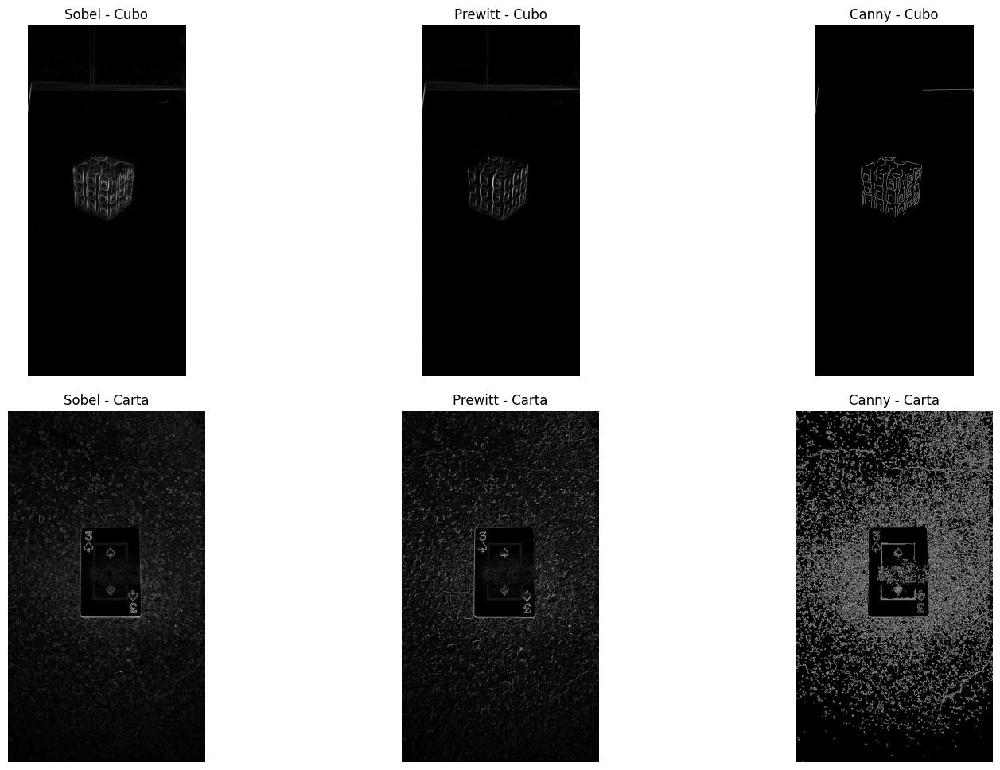

In [22]:
# demonstração visual

imagens_filtradas = [sobel_xy_cubo,
                     prewitt_xy_cubo,
                     canny2_cubo,
                     sobel_xy_carta,
                     prewitt_xy_carta,
                     canny2_carta]

nomes = ['Sobel - Cubo',
         'Prewitt - Cubo',
         'Canny - Cubo',
         'Sobel - Carta',
         'Prewitt - Carta',
         'Canny - Carta']

fig, ax = utils.criar_figure('', 2, 3, (15,10))

# infelizmente o meu método é limitado para o preenchimento
# de axes bidimensionais
# pretendo implementar isso, mas apenas no futuro

ax[0][0].imshow(imagens_filtradas[0], cmap='gray')
ax[0][0].set_title(nomes[0])
ax[0][1].imshow(imagens_filtradas[1], cmap='gray')
ax[0][1].set_title(nomes[1])
ax[0][2].imshow(imagens_filtradas[2], cmap='gray')
ax[0][2].set_title(nomes[2])
ax[1][0].imshow(imagens_filtradas[3], cmap='gray')
ax[1][0].set_title(nomes[3])
ax[1][1].imshow(imagens_filtradas[4], cmap='gray')
ax[1][1].set_title(nomes[4])
ax[1][2].imshow(imagens_filtradas[5], cmap='gray')
ax[1][2].set_title(nomes[5])

for i in range(2):
    for j in range(3):
        ax[i][j].axis('off')


## Observações:
- Sobel:
  - Cubo: Sobel detectou bem as bordas do cubo, mas teve foco na silhueta dele.
  
  - Carta:Sobel foi o filtro que melhor segmentou os detalhes impressos na carta, mas não teve bordas tão bem definidas quanto prewitt em relação ao molde da carta.

- Prewitt:
  - Cubo: Prewitt segmentou melhor os detalhes do cubo, dando uma maior nitidez aos pequenos quadrados que o compõe.

  - Carta: Prewitt não segmentou tão bem os detalhes impressos na carta, mas deixou o molde dela bem mais nítido do que em sobel.

- Canny:
  - Cubo: Canny foi prejudicado pelo ruído, tendo gerado linhas tortas e perdido bordas no limiar de 80-130.

  - Carta: Canny foi a que mais destacou o molde da carta em relação ao fundo da imagem. Todavia, o filtro foi fortemente prejudicado pelo padrão do fundo, gerando uma grande quantidade de linhas indesejadas na imagem.

## Aplicação de filtros de detecção após suavização

- Imagens selecionadas:
    - carta1.jpeg
    - cubo1.jpeg

- Escolha do filtro - Carta
  - Filtro: Filtro da Mediana 5x5
  - Motivo: o principal ruído da imagem é o estouro de luz, mas quero usar um kernel maior para verificar se é possivel atenuar os pequenos pontos no fundo.

- Escolha do filtro - Cubo
  - Filtro: Filtro gaussiano | sigma = 3
  - Motivo: a ideia principal é aplicar o filtro que consiga preservar o máximo possivel a imagem sem prejudicar ela mais ainda. Tendo isso em mente, o filtro mais seguro é o gaussiano.



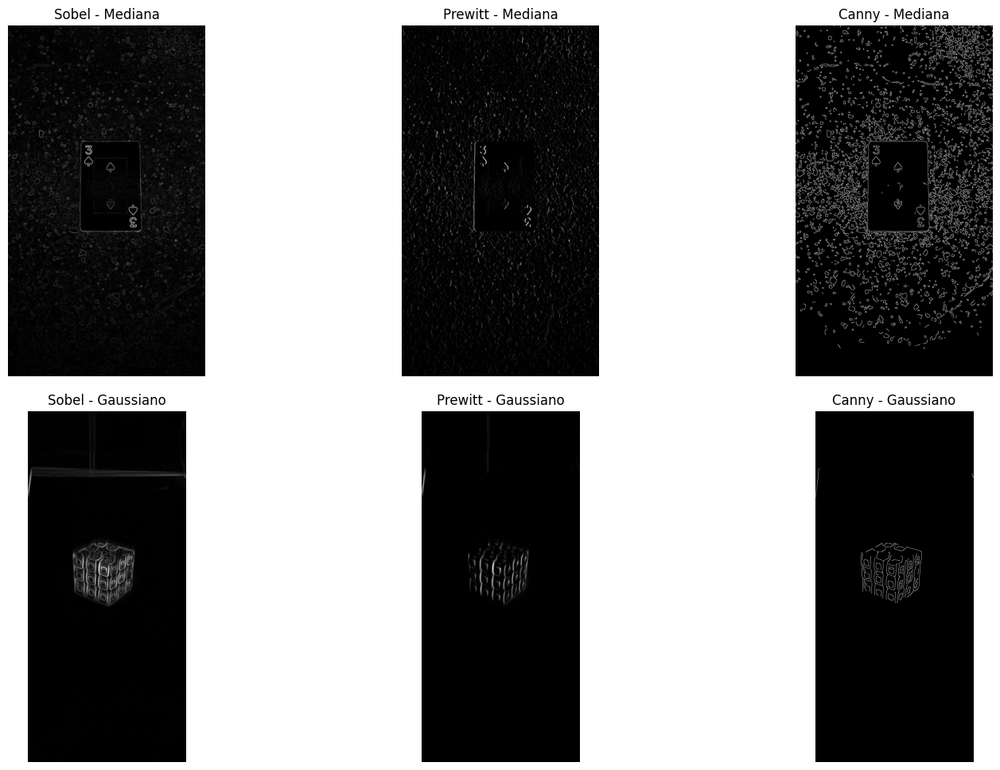

In [23]:
# lendo como gray para facilitar o processo
carta = cv.imread('carta1.jpeg', cv.IMREAD_GRAYSCALE)
cubo = cv.imread('cubo1.jpeg', cv.IMREAD_GRAYSCALE)

mediana = cv.medianBlur(carta, 5)
gaussiano = cv.GaussianBlur(cubo, (5,5), 3)

# carta Sobel
sobel_mediana_x = cv.Sobel(mediana, cv.CV_64F, 1, 0, ksize=3)
sobel_mediana_y = cv.Sobel(mediana, cv.CV_64F, 0, 1, ksize=3)
sobel_carta = cv.magnitude(sobel_mediana_x, sobel_mediana_y)

# cubo Sobel
sobel_gaussiano_x = cv.Sobel(gaussiano, cv.CV_64F, 1, 0, ksize=3)
sobel_gaussiano_y = cv.Sobel(gaussiano, cv.CV_64F, 0, 1, ksize=3)
sobel_cubo = cv.magnitude(sobel_gaussiano_x, sobel_gaussiano_y)

# carta Prewitt
arr = np.array([[-1,0,1],[-1,0,1],[-1,0,1]])
prewitt_mediana = cv.filter2D(mediana, -1, arr)

# cubo Prewitt
prewitt_gaussiana = cv.filter2D(gaussiano, -1, arr)

# carta Canny
canny_mediana = cv.Canny(mediana, 50, 100)
canny_gaussiano = cv.Canny(gaussiano, 50, 100)

filtros_suavizados = [sobel_carta,
        sobel_cubo,
        prewitt_mediana,
        prewitt_gaussiana,
        canny_mediana,
        canny_gaussiano]

nomes = ['Sobel - Mediana', # 0 (Carta)
         'Sobel - Gaussiano', # 1 (Cubo)
         'Prewitt - Mediana', # 2 (Carta)
         'Prewitt - Gaussiano', # 3 (Cubo)
         'Canny - Mediana', # 4 (Carta)
         'Canny - Gaussiano'] # 5 (Cubo)

fig, ax = utils.criar_figure('', 2, 3, (15,10))

ax[0][0].imshow(filtros_suavizados[0], cmap='gray') # sobel_carta
ax[0][0].set_title(nomes[0])
ax[0][1].imshow(filtros_suavizados[2], cmap='gray') # prewitt_mediana
ax[0][1].set_title(nomes[2])
ax[0][2].imshow(filtros_suavizados[4], cmap='gray') # canny_mediana
ax[0][2].set_title(nomes[4])

ax[1][0].imshow(filtros_suavizados[1], cmap='gray') # sobel_cubo
ax[1][0].set_title(nomes[1])
ax[1][1].imshow(filtros_suavizados[3], cmap='gray') # prewitt_gaussiana
ax[1][1].set_title(nomes[3])
ax[1][2].imshow(filtros_suavizados[5], cmap='gray') # canny_gaussiano
ax[1][2].set_title(nomes[5])

for i in range(2):
    for j in range(3):
        ax[i][j].axis('off')


## Quantidades de bordas detectadas:

In [26]:
# Como as imagens estão em preto e branco, basta contar
# a quantidade de pixels > 0, que representam bordas
print('Bordas Suavizadas')
print('-'*50)
for i, img_filtrada in enumerate(filtros_suavizados):
    # conta pixels
    num_bordas = np.sum(img_filtrada > 0)
    print(f'{nomes[i]:<25}: {num_bordas} bordas')
print('-'*50)

print('Bordas sem suavização prévia')
print('-'*50)
# Re-define imagens_filtradas to ensure it has the correct (name, image) tuple structure
# as the original 'imagens_filtradas' list was overwritten in a previous cell (gyJszD1Izg6O)
imagens_filtradas_sem_suavizacao = [
    ("Sobel - cubo",    sobel_xy_cubo),
    ("Sobel - carta",   sobel_xy_carta),
    ("Prewitt - cubo",  prewitt_xy_cubo),
    ("Prewitt - carta", prewitt_xy_carta),
    ("Canny - cubo", canny2_cubo),
    ("Canny - carta", canny2_carta)
]
for nome_filtro, img_filtrada in imagens_filtradas_sem_suavizacao:
    num_bordas = np.sum(img_filtrada > 0)
    print(f'{nome_filtro:<25}: {num_bordas} bordas')
print('-'*50)

Bordas Suavizadas
--------------------------------------------------
Sobel - Mediana          : 895814 bordas
Sobel - Gaussiano        : 203918 bordas
Prewitt - Mediana        : 435767 bordas
Prewitt - Gaussiano      : 55139 bordas
Canny - Mediana          : 59039 bordas
Canny - Gaussiano        : 4287 bordas
--------------------------------------------------
Bordas sem suavização prévia
--------------------------------------------------
Sobel - cubo             : 198873 bordas
Sobel - carta            : 906910 bordas
Prewitt - cubo           : 115016 bordas
Prewitt - carta          : 673501 bordas
Canny - cubo             : 4623 bordas
Canny - carta            : 144091 bordas
--------------------------------------------------


## Tabela de Perda de Bordas

| Filtro                   | Perda de Bordas (%) |
|:-------------------------|:-------------------:|
| Sobel - Carta (Mediana)  |        1.22         |
| Sobel - Cubo (Gaussiano) |       -2.54         |
| Prewitt - Carta (Mediana)|        35.30        |
| Prewitt - Cubo (Gaussiano)|        52.06        |
| Canny - Carta (Mediana)  |        59.03        |
| Canny - Cubo (Gaussiano) |        7.27         |


## Continuidade das bordas reais:
- Sobel:
  - Cubo: as bordas antes da suavização eram menos intensas do que após a suavização. O cubo parece ter ficado nítido, mas é possível perceber que o desfoque aumentou.

  - Carta: não consegui visualizar grandes alterações na carta entre Sobel antes de aplicar a suavização e depois de aplicar a suavização. Todavia, percebi que o fundo da imagem perdeu intensidade.

- Prewitt:
  - Cubo: o cubo perdeu um pouco das bordas, sua silhueta ficou mais fraca. Em compensação, os detalhes do cubo ficaram mais destacados e as bordas externas a ele foram atenuadas.

  - Carta: a carta perdeu detalhes, os números ficaram menos detalhados. As bordas do molde da carta ficaram menos nítidos. Em contrapartida, o fundo da imagem adotou uma textura interessante.

- Canny:
  - Cubo: a imagem não sofreu muitas alterações nas bordas. Isso prova como o filtro gaussiano realmente tem uma maior capacidade de preservar as bordas de uma imagem.

  - Carta: essa foi a maior alteração. As bordas formadas pelo fundo da imagem caíram em grande quantidade, enquanto a borda do centro da carta, causada pelo estouro de luz, foi quase totalmente removida.  


## Síntese Final - Aplicação de filtros após suavização

### A suavização melhorou a detecção?
- A suavização melhorou a detecção de bordas, especialmente em imagens com ruído ou degradação, ao reduzir a interferência e permitir que os operadores de borda atuassem de forma mais eficaz.

### Qual foi o operador mais robusto ao ruído
 - **Operador mais robusto ao ruído:**
  - **Carta (estouro de luz):** O filtro Canny mostrou-se mais eficaz na remoção do estouro de luz, suprimindo as bordas indesejadas causadas pela alta intensidade e destacando as bordas reais da carta.
  - **Cubo (desfoque):** O operador Sobel manteve melhor a silhueta geral do cubo mesmo com a presença de desfoque, demonstrando boa robustez para este tipo de degradação.

### Qual representou a melhor definição estrutural
 - **Carta:** Para a carta, o operador Sobel manteve melhor o molde da carta em comparação ao fundo. Embora o Canny tenha sido bom na detecção de bordas, foi muito prejudicado pelo padrão do fundo da imagem, gerando bordas indesejadas.
 - **Cubo:** Para o cubo, o Sobel também se destacou, mantendo melhor as bordas da silhueta do objeto, tanto antes quanto depois da suavização, o que é crucial para a integridade estrutural em casos de desfoque.